In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import numpy as np
from collections import Counter
import re
import string
import os
from os import path
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [2]:
# load raw news categorisation dataset
df = pd.read_csv("raw categorisation dataset.csv")

In [3]:
# clean dataset
# remove data that has >280 characters and <15 characters
df = df[df["content"].str.len() <=280]
df = df[df["content"].str.len() >15]

# remove special characters
from nltk.corpus import stopwords as nltkstopwords
stops = set(nltkstopwords.words("english"))
def cleantext(string):
    text = string.lower().split()
    text = " ".join(text)
    text = re.sub(r"http(\S)+",' ',text)    
    text = re.sub(r"www(\S)+",' ',text)
    text = re.sub(r"&",' and ',text)  
    tx = text.replace('&amp',' ')
    text = re.sub(r"[^0-9a-zA-Z]+",' ',text)
    text = text.split()
    text = [w for w in text if not w in stops]
    text = " ".join(text)
    return text

df["content"] = df["content"].apply(cleantext)

shuffledDf = df.sample(frac=1).reset_index(drop=True)

shuffledDf

,Unnamed: 0,content,label
0,29,says 80 novel coronavirus cases mild,0
1,884,trump adviser working wh officials messaging p...,0
2,645,us president donald trump federal authorities ...,0
3,1689,provincial update 19 june changes yesterday hi...,0
4,2748,trump cut scheduled federal pay raise serious ...,1
...,...,...,...
2851,159,virus cure called hydroxychloroquine zinc zith...,0
2852,1728,kanye jared kushner family got ppp loans wonde...,0
2853,1937,broke news outloudwithgiannocaldwell laraleatr...,0
2854,1724,damn corona virus thing actually pretty scary ...,0


In [19]:
# save cleaned news categorisation dataset
df.to_csv("news categorisation dataset.csv", index=False)

In [4]:
# sample df for balanced dataset
normaldf = df[df["label"]==1]
coviddf = df[df["label"]==0]

normalColCount = len(normaldf)
covidColCount = len(coviddf)

sampleNumber = min(normalColCount, covidColCount)

normaldf = normaldf.sample(n=sampleNumber,random_state=1)
coviddf = coviddf.sample(n=sampleNumber,random_state=1)
print("normal count: ", normaldf.shape[0])
print("covid count: ",coviddf.shape[0])

normal count:  1109
covid count:  1109


In [21]:
# save sampled and class wise balanced datasets for classification tuning
df.to_csv("Sampled news categorisation dataset.csv", index=False)

In [5]:
# define extra stop words
stops = stops.union({'pic','co','com','u','twitter'})

Number of covid data 1747
Number of normal data 1109


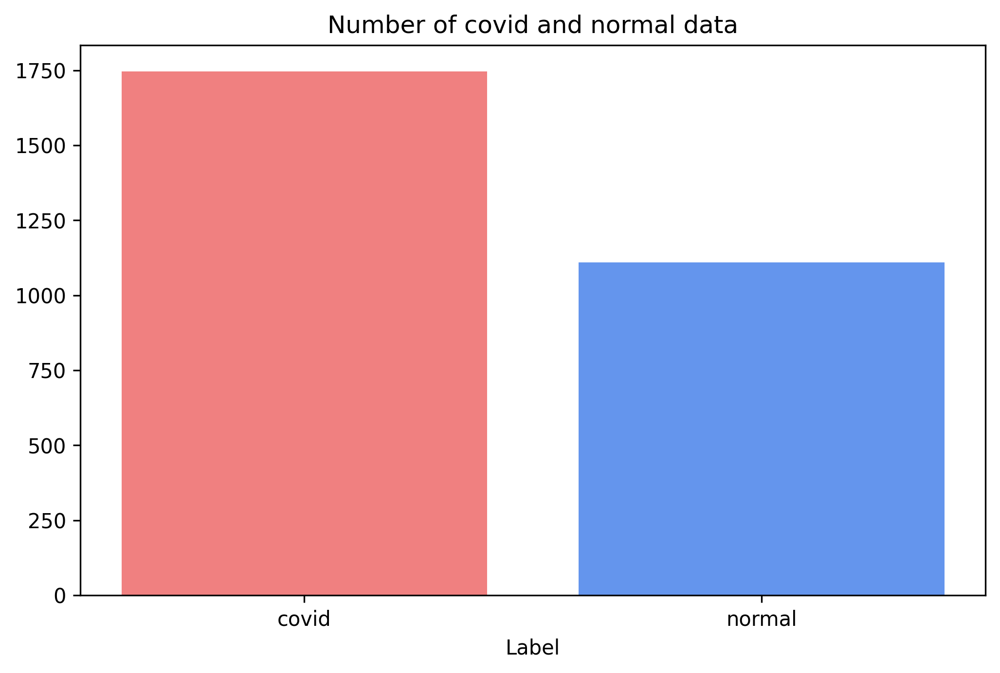

<function matplotlib.pyplot.show(close=None, block=None)>

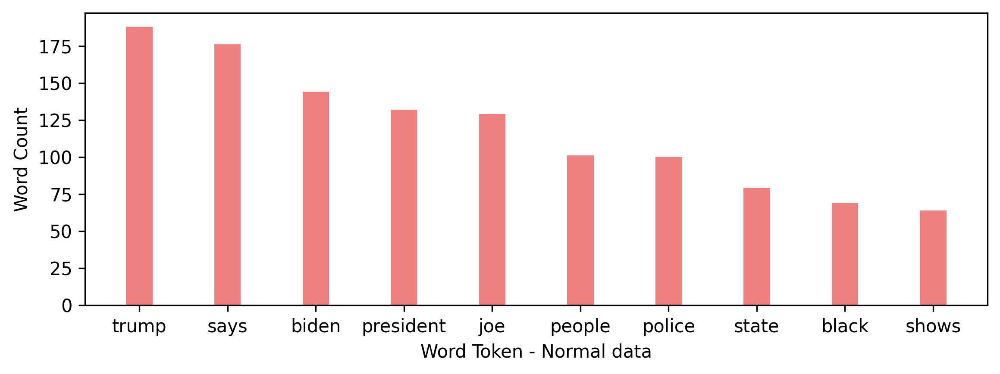

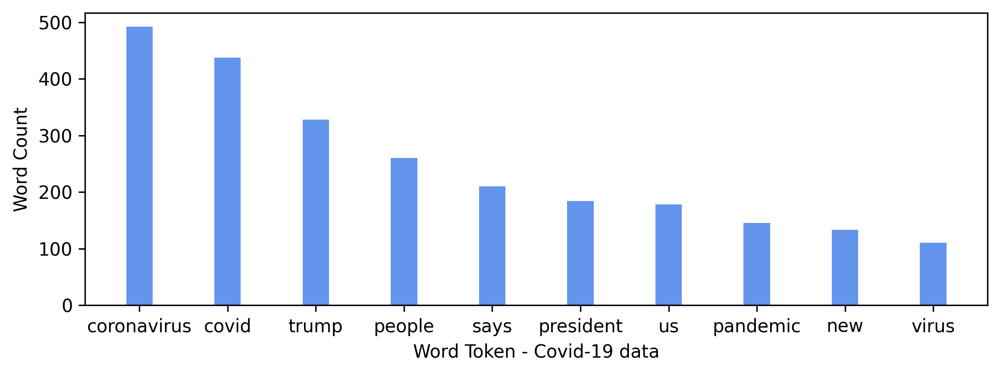

In [6]:
# Analyse Data
allText = df['content']
allTextCombined = ' '.join(allText)

fakeText = df[df.label == 0]
print("Number of covid data", fakeText.shape[0])
fakeTextCombined = ' '.join(fakeText["content"])

realText = df[df.label == 1]
print("Number of normal data", realText.shape[0])
realTextCombined = ' '.join(realText["content"])

allTokensWords = [w for w in str(allTextCombined).split() if len(w)>1 and w not in stops]
allWordCount = (Counter(allTokensWords).most_common(10))

fakeTokensWords = [w for w in str(fakeTextCombined).split() if len(w)>1 and w not in stops]
fakeWordCount = (Counter(fakeTokensWords).most_common(10))

realTokensWords = [w for w in str(realTextCombined).split() if len(w)>1 and w not in stops]
realWordCount = (Counter(realTokensWords).most_common(10))

plt.figure(figsize=(8,5))
plt.title("Number of covid and normal data")
plt.xlabel("Label")
plt.bar(["covid"],[fakeText.shape[0]],color="lightcoral")
plt.bar(["normal"],[realText.shape[0]],color="cornflowerblue")
plt.show()

ypos = np.arange(10)
plt.figure(figsize=(9,3))
plt.xticks(ypos, [i[0] for i in realWordCount])
plt.bar(ypos, [i[1] for i in realWordCount], width=0.3, color="lightcoral")
plt.xlabel("Word Token - Normal data")
plt.ylabel("Word Count")
plt.show

plt.figure(figsize=(9,3))
plt.xticks(ypos, [i[0] for i in fakeWordCount])
plt.bar(ypos, [i[1] for i in fakeWordCount], width=0.3, color="cornflowerblue")
plt.xlabel("Word Token - Covid-19 data")
plt.ylabel("Word Count")
plt.show

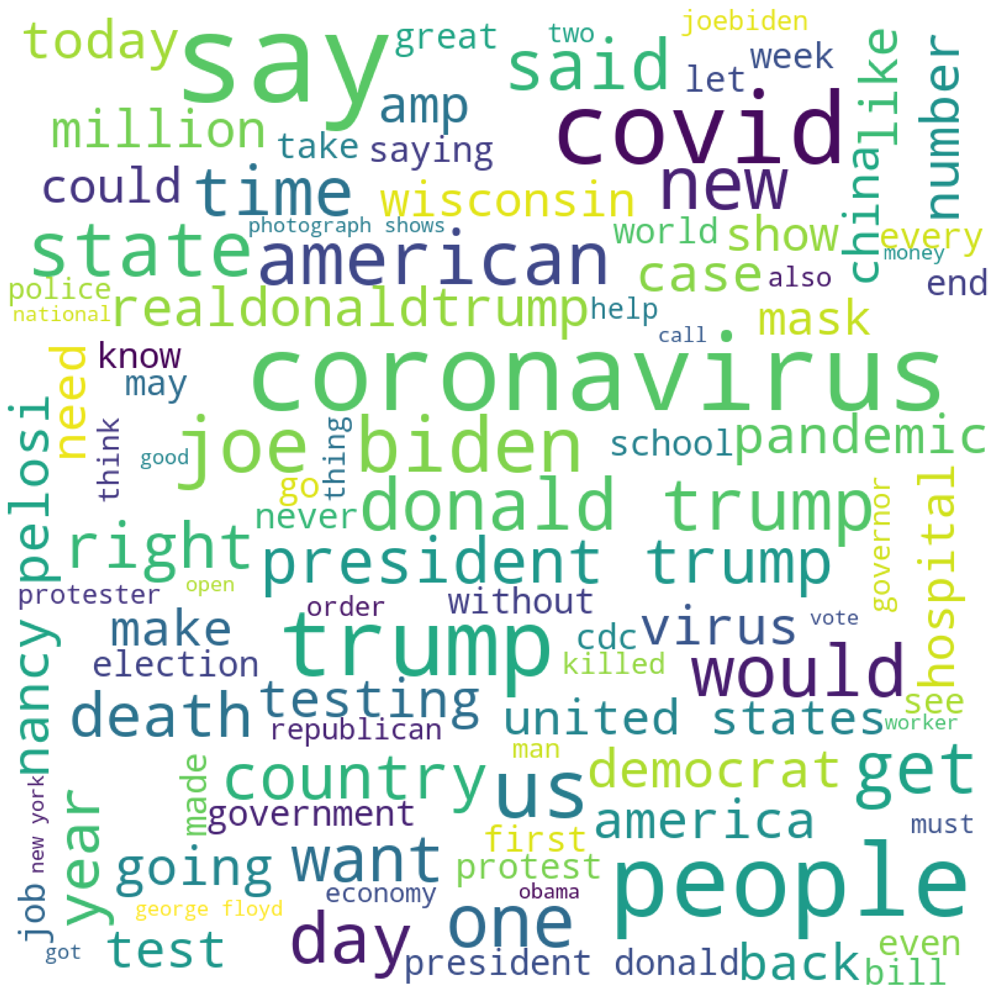

In [8]:
# wordcloud generation of news categorisation dataset
wordcloud1 = WordCloud(background_color="white", max_words = 100 , width = 800 , height = 800,
               stopwords=stops, max_font_size=100, random_state=42).generate(str(allTextCombined))
plt.figure(figsize=(20,20))
plt.imshow(wordcloud1)
plt.axis("off")
plt.show()

(-0.5, 799.5, 799.5, -0.5)

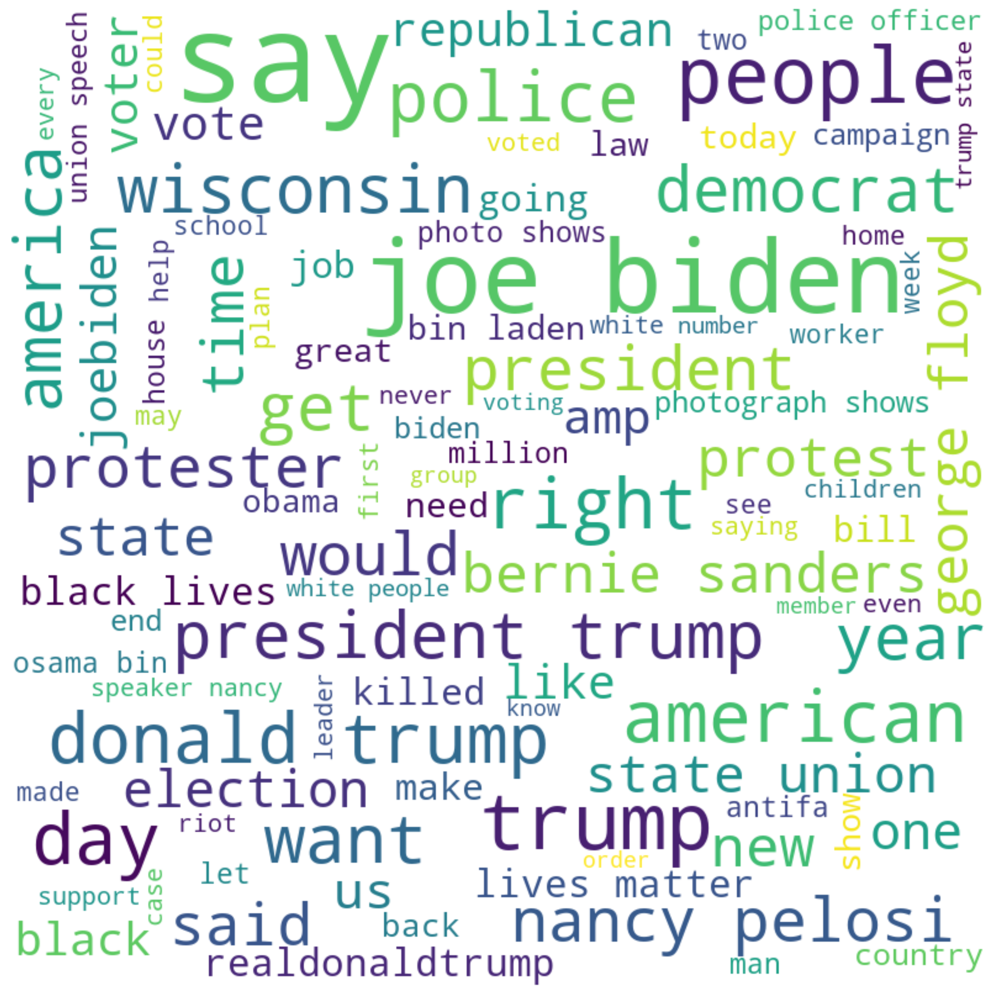

In [10]:
# normal word cloud

corpus_str = str(realTextCombined)

wc = WordCloud(background_color="white", max_words = 100 , width = 800 , height = 800,
               stopwords=stops, max_font_size=100, random_state=42)

# generate word cloud
wc.generate(corpus_str)
plt.figure(figsize = (20,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

(-0.5, 799.5, 799.5, -0.5)

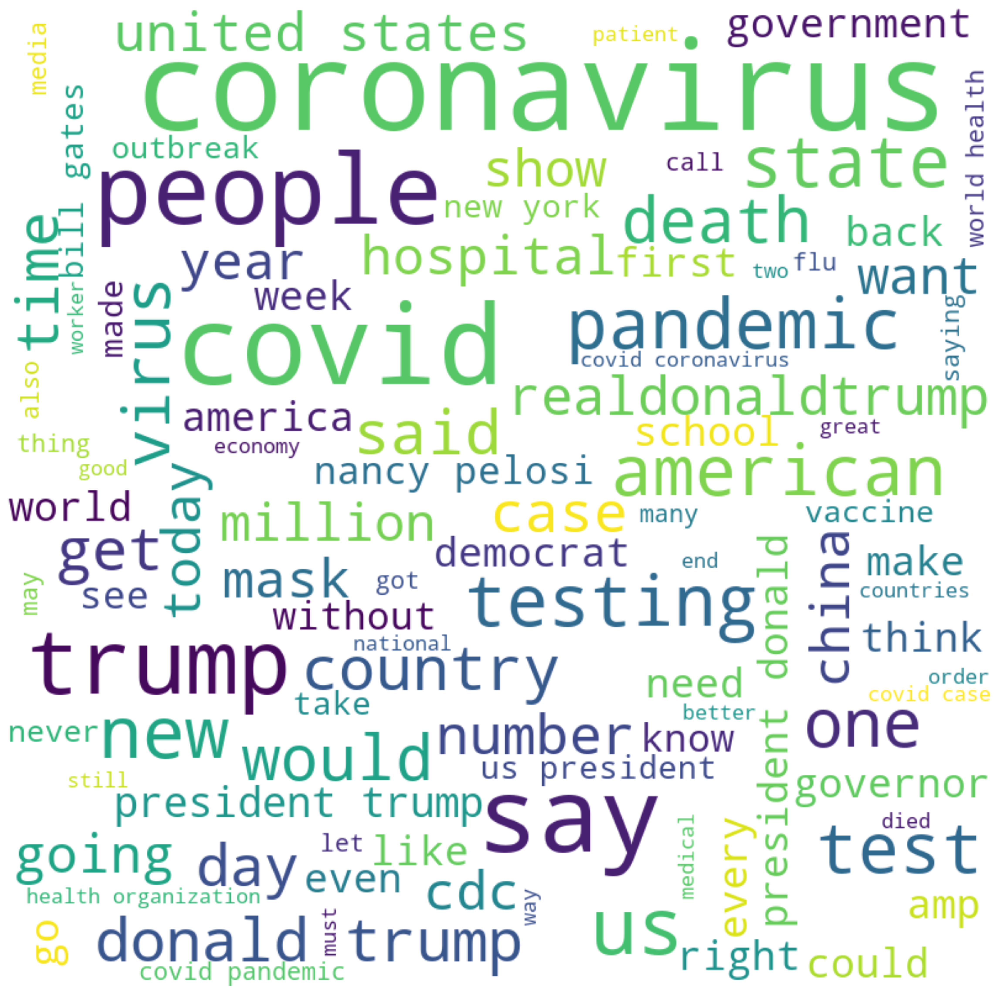

In [11]:
# covid-19 word cloud
corpus_str = str(fakeTextCombined)

wc = WordCloud(background_color="white", max_words = 100 , width = 800 , height = 800,
               stopwords=stops, max_font_size=100, random_state=42)

# generate word cloud
wc.generate(corpus_str)

plt.figure(figsize = (20,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")